# Scoring normalized expression data with edgeR

----------------------

Starting with normalized RNAseq count data  the aim of this supplementary protocol is to filter and score RNAseq data using edgeR to generate the required files that can be used in most enrichment tools, but specifically GSEA and g:Profiler.  The output files of this part are the same as supplemental protocol 1 except they are generated from RNAseq data and require a different pipeline to generate. For thresholded tools like g:Profiler we need to retrieve a list of genes that are differentially expressed using a significance cut-off that will be the input of the gene-set enrichment tool. For GSEA, we need to create a file containing a ranked list of all genes. The ranked file should consist of 2 columns, the first specifies the gene name and the second a numeric value representing the level of differential expression. For both methods, the first step involves calculating a statistic for each gene that represents the degree of difference in the level of abundance between the two groups. This step is performed using the edgeR package.

## 1. Load required Bioconductor packages into R

><span style="color:purple">**TIP: we need to load the libraries each time we open a new R session, even if we have loaded an existing saved workspace.**</span>

In [1]:
library("edgeR")

Loading required package: limma


## 2. Set working directory

Make sure you set your working directory to the location of where the supplemental data 1, 2, 3 and 4 are stored.

><span style="color:purple">**TIP: the function getwd() can be used to retrieve the working directory and dir() to see what files are located in this directory**</span>

In [2]:
setwd("./data")

## 3. Load expression data 

Our dataset consists of 119 patients, 77 classified as Immunoreactive and 42 classified as Mesenchymal.RNAseq data was filtered to only include patients that also had corresponding affy expression data.

In [3]:
RNAseq <- read.table( "SupplementaryDataTable2.txt", header = TRUE, sep = "\t", quote="\"",  stringsAsFactors = FALSE ) 

><span style="color:purple">**TIP: type the command head(expressionMatrix) to see if you have loaded the matrix correctly**</span>

In [4]:
head(RNAseq) 

,TCGA.13.0890.01A.01R,TCGA.13.1405.01A.01R,TCGA.13.1481.01A.01R,TCGA.13.1505.01A.01R,TCGA.13.1512.01A.01R,TCGA.20.1682.01A.01R,TCGA.24.0975.01A.02R,TCGA.24.1418.01A.01R,TCGA.24.1427.01A.01R,TCGA.24.1550.01A.01R,TCGA.24.1563.01A.01R,TCGA.24.1564.01A.01R,TCGA.24.2033.01A.01R,TCGA.24.2035.01A.01R,TCGA.24.2254.01A.01R,TCGA.24.2298.01A.01R,TCGA.25.1326.01A.01R,TCGA.25.1328.01A.01R,TCGA.25.1329.01A.01R,TCGA.25.1623.01A.01R,TCGA.25.1633.01A.01R,TCGA.25.1635.01A.01R,TCGA.25.2399.01A.01R,TCGA.25.2404.01A.01R,TCGA.29.1690.01A.01R,TCGA.29.1693.01A.01R,TCGA.29.1695.01A.01R,TCGA.29.1705.01A.01R,TCGA.29.1770.02A.01R,TCGA.29.1783.01A.01R,TCGA.30.1718.01A.01R,TCGA.30.1862.01A.02R,TCGA.30.1891.01A.01R,TCGA.31.1951.01A.01R,TCGA.36.1580.01A.01R,TCGA.61.1721.01A.01R,TCGA.61.1733.01A.01R,TCGA.61.1919.01A.01R,TCGA.61.1998.01A.01R,TCGA.61.2009.01A.01R,TCGA.61.2102.01A.01R,TCGA.61.2113.01A.01R,TCGA.04.1348.01A.01R,TCGA.04.1357.01A.01R,TCGA.04.1365.01A.01R,TCGA.09.0366.01A.01R,TCGA.09.1667.01C.01R,TCGA.09.1668.01B.01R,TCGA.09.2044.01B.01R,TCGA.09.2051.01A.01R,TCGA.13.0801.01A.01R,TCGA.13.0893.01B.01R,TCGA.13.0897.01A.01R,TCGA.13.0924.01A.01R,TCGA.13.1410.01A.01R,TCGA.13.1498.01A.01R,TCGA.13.1507.01A.01R,TCGA.13.2060.01A.01R,TCGA.20.1685.01A.01R,TCGA.23.1120.01A.02R,TCGA.23.1123.01A.01R,TCGA.23.2077.01A.01R,TCGA.23.2084.01A.02R,TCGA.24.1417.01A.01R,TCGA.24.1428.01A.01R,TCGA.24.1436.01A.01R,TCGA.24.1474.01A.01R,TCGA.24.1549.01A.01R,TCGA.24.1551.01A.01R,TCGA.24.1553.01A.01R,TCGA.24.1556.01A.01R,TCGA.24.1842.01A.01R,TCGA.24.1843.01A.01R,TCGA.24.1846.01A.01R,TCGA.24.1847.01A.01R,TCGA.24.1924.01A.01R,TCGA.24.1930.01A.01R,TCGA.24.2026.01A.01R,TCGA.24.2261.01A.01R,TCGA.24.2267.01A.01R,TCGA.24.2281.01A.01R,TCGA.24.2288.01A.01R,TCGA.24.2290.01A.01R,TCGA.25.1313.01A.01R,TCGA.25.1322.01A.01R,TCGA.25.1630.01A.01R,TCGA.25.2392.01A.01R,TCGA.25.2396.01A.01R,TCGA.29.1688.01A.01R,TCGA.29.1699.01A.01R,TCGA.29.1701.01A.01R,TCGA.29.1710.01A.02R,TCGA.29.1711.01A.01R,TCGA.29.1761.01A.01R,TCGA.29.1781.01A.01R,TCGA.29.1784.01A.02R,TCGA.29.1785.01A.01R,TCGA.29.2427.01A.01R,TCGA.29.2428.01A.01R,TCGA.30.1855.01A.01R,TCGA.30.1860.01A.01R,TCGA.31.1950.01A.01R,TCGA.31.1953.01A.01R,TCGA.31.1956.01A.01R,TCGA.36.1574.01A.01R,TCGA.36.1578.01A.01R,TCGA.36.1581.01A.01R,TCGA.57.1994.01A.01R,TCGA.59.2351.01A.01R,TCGA.61.1725.01A.01R,TCGA.61.1738.01A.01R,TCGA.61.1740.01A.01R,TCGA.61.1907.01A.01R,TCGA.61.1914.01A.01R,TCGA.61.1995.01A.01R,TCGA.61.2000.01A.01R,TCGA.61.2012.01A.01R,TCGA.61.2094.01A.01R,TCGA.61.2104.01A.01R
?|100130426,0,0,0,0,0,0,0,0,0,0,0,0,0,1.08,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.27,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1.08,0,0,0,0,0,0,0
?|100133144,60.32,75.69,155.61,33.31,6.49,18.83,3.72,24.96,110.7,27.55,36.29,32.66,118.28,6.03,37.97,69.72,110.2,32.19,84.58,31.73,16.7,84.88,149.94,79.95,27.68,91.91,30.96,132.81,85.79,54.78,8.82,33.11,28.07,222.84,74.11,38.33,26.63,7.56,17.42,103.54,10.48,76.57,101.62,33.74,43.14,30.33,17.39,30.45,68.94,72.34,31.17,31.25,6.13,13.31,47.67,7.08,41.27,64.28,213.19,27.43,164.35,22.88,112.23,21.07,101.86,56.39,38.98,26.15,96.2,80.36,359.12,60.25,53.62,89.36,105.86,42.03,46.83,104.86,136.51,165.26,30.24,69.94,69.81,126.08,53.19,23.41,16.8,43.28,22.07,130.23,86.17,21.08,5.7,18.57,39.05,86.63,19.34,13.18,31.3,75.89,6,80.24,101.47,10.44,10.97,73.27,18.83,77.86,51.62,62.58,58.74,75.38,57.99,146.86,239.54,42.05,39.31,252.51,71.6
?|100134869,90.68,40.31,170.39,62.69,11.51,50.17,48.28,40.04,139.3,105.45,46.71,51.34,194.72,39.97,61.03,258.28,89.8,32.81,66.42,60.27,41.3,57.12,229.06,65.05,71.32,167.09,45.04,216.19,238.21,208.22,58.18,132.89,79.93,431.16,141.89,40.67,73.37,27.44,50.58,150.46,8.52,45.43,170.38,56.26,30.86,81.67,28.61,33.55,128.06,59.66,52.83,61.75,45.87,30.69,65.33,19.92,38.73,114.72,136.81,77.57,114.65,55.12,66.77,37.93,196.14,111.61,71.02,54.85,146.8,276.64,256.88,132.75,59.38,65.64,54.14,91.97,199.17,126.14,143.49,21

## 4. Load data classification

In order to calculate differential expression we need to define at least 2 classesgroups that we want to compare.  These classification will be different depending on the dataset.  A common example of classes used is Case vs Control but a genralization of the 2 class comparison can be Population 1 vs Population 2. any two classes can be compared and used to calculate differential expression.  For this analysis our dataset is divided into 2 different classes, Mmesenchymal, and Iimmunoreactive.

In [5]:
classDefinitions_RNAseq <-  read.table( "SupplementaryDataTable4.txt", header = TRUE, 
                                       sep = "\t", quote="\"",  stringsAsFactors = FALSE)

In [6]:
head(classDefinitions_RNAseq)

,patient,barcode,SUBTYPE
1,TCGA-13-0890,TCGA.13.0890.01A.01R,Mesenchymal
2,TCGA-13-1405,TCGA.13.1405.01A.01R,Mesenchymal
3,TCGA-13-1481,TCGA.13.1481.01A.01R,Mesenchymal
4,TCGA-13-1505,TCGA.13.1505.01A.01R,Mesenchymal
5,TCGA-13-1512,TCGA.13.1512.01A.01R,Mesenchymal
6,TCGA-20-1682,TCGA.20.1682.01A.01R,Mesenchymal


## 5. Filter data

RNAseq data processing was accomplished following step 14 of edgeR [nature protocol](https://www.ncbi.nlm.nih.gov/pubmed/23975260). Filter dataset using counts per million(CPM).   Convert RNAseq data to counts per million.  Keep genes that have at least cpm > 1 for at least 42 of the samples (i.e., the minimal sample size in the classes). The aim of this step is to remove genes whose number of reads are so small that it could indicate that these genes are not expressed in the mesenchymal and immunoreactive samples and including them would add substantial noise to the data.

><span style="color:purple">**TIP: conversion to CPM is done to remove low counts but differential expression analysis will be using the normalized read counts.**</span> 

In [7]:
cpms <- cpm(RNAseq)
keep <- rowSums(cpms > 1) >= 42
counts <- RNAseq[keep,]

In [8]:
head(cpms)

,TCGA.13.0890.01A.01R,TCGA.13.1405.01A.01R,TCGA.13.1481.01A.01R,TCGA.13.1505.01A.01R,TCGA.13.1512.01A.01R,TCGA.20.1682.01A.01R,TCGA.24.0975.01A.02R,TCGA.24.1418.01A.01R,TCGA.24.1427.01A.01R,TCGA.24.1550.01A.01R,TCGA.24.1563.01A.01R,TCGA.24.1564.01A.01R,TCGA.24.2033.01A.01R,TCGA.24.2035.01A.01R,TCGA.24.2254.01A.01R,TCGA.24.2298.01A.01R,TCGA.25.1326.01A.01R,TCGA.25.1328.01A.01R,TCGA.25.1329.01A.01R,TCGA.25.1623.01A.01R,TCGA.25.1633.01A.01R,TCGA.25.1635.01A.01R,TCGA.25.2399.01A.01R,TCGA.25.2404.01A.01R,TCGA.29.1690.01A.01R,TCGA.29.1693.01A.01R,TCGA.29.1695.01A.01R,TCGA.29.1705.01A.01R,TCGA.29.1770.02A.01R,TCGA.29.1783.01A.01R,TCGA.30.1718.01A.01R,TCGA.30.1862.01A.02R,TCGA.30.1891.01A.01R,TCGA.31.1951.01A.01R,TCGA.36.1580.01A.01R,TCGA.61.1721.01A.01R,TCGA.61.1733.01A.01R,TCGA.61.1919.01A.01R,TCGA.61.1998.01A.01R,TCGA.61.2009.01A.01R,TCGA.61.2102.01A.01R,TCGA.61.2113.01A.01R,TCGA.04.1348.01A.01R,TCGA.04.1357.01A.01R,TCGA.04.1365.01A.01R,TCGA.09.0366.01A.01R,TCGA.09.1667.01C.01R,TCGA.09.1668.01B.01R,TCGA.09.2044.01B.01R,TCGA.09.2051.01A.01R,TCGA.13.0801.01A.01R,TCGA.13.0893.01B.01R,TCGA.13.0897.01A.01R,TCGA.13.0924.01A.01R,TCGA.13.1410.01A.01R,TCGA.13.1498.01A.01R,TCGA.13.1507.01A.01R,TCGA.13.2060.01A.01R,TCGA.20.1685.01A.01R,TCGA.23.1120.01A.02R,TCGA.23.1123.01A.01R,TCGA.23.2077.01A.01R,TCGA.23.2084.01A.02R,TCGA.24.1417.01A.01R,TCGA.24.1428.01A.01R,TCGA.24.1436.01A.01R,TCGA.24.1474.01A.01R,TCGA.24.1549.01A.01R,TCGA.24.1551.01A.01R,TCGA.24.1553.01A.01R,TCGA.24.1556.01A.01R,TCGA.24.1842.01A.01R,TCGA.24.1843.01A.01R,TCGA.24.1846.01A.01R,TCGA.24.1847.01A.01R,TCGA.24.1924.01A.01R,TCGA.24.1930.01A.01R,TCGA.24.2026.01A.01R,TCGA.24.2261.01A.01R,TCGA.24.2267.01A.01R,TCGA.24.2281.01A.01R,TCGA.24.2288.01A.01R,TCGA.24.2290.01A.01R,TCGA.25.1313.01A.01R,TCGA.25.1322.01A.01R,TCGA.25.1630.01A.01R,TCGA.25.2392.01A.01R,TCGA.25.2396.01A.01R,TCGA.29.1688.01A.01R,TCGA.29.1699.01A.01R,TCGA.29.1701.01A.01R,TCGA.29.1710.01A.02R,TCGA.29.1711.01A.01R,TCGA.29.1761.01A.01R,TCGA.29.1781.01A.01R,TCGA.29.1784.01A.02R,TCGA.29.1785.01A.01R,TCGA.29.2427.01A.01R,TCGA.29.2428.01A.01R,TCGA.30.1855.01A.01R,TCGA.30.1860.01A.01R,TCGA.31.1950.01A.01R,TCGA.31.1953.01A.01R,TCGA.31.1956.01A.01R,TCGA.36.1574.01A.01R,TCGA.36.1578.01A.01R,TCGA.36.1581.01A.01R,TCGA.57.1994.01A.01R,TCGA.59.2351.01A.01R,TCGA.61.1725.01A.01R,TCGA.61.1738.01A.01R,TCGA.61.1740.01A.01R,TCGA.61.1907.01A.01R,TCGA.61.1914.01A.01R,TCGA.61.1995.01A.01R,TCGA.61.2000.01A.01R,TCGA.61.2012.01A.01R,TCGA.61.2094.01A.01R,TCGA.61.2104.01A.01R
?|100130426,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.031286852,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.010836701,0.021606303,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.009294677,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.037404626,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.013640139,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.015804940,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000
?|100133144,0.74685278,1.16281939,2.47058891,0.83078256,0.14

In [9]:
head(counts)

,TCGA.13.0890.01A.01R,TCGA.13.1405.01A.01R,TCGA.13.1481.01A.01R,TCGA.13.1505.01A.01R,TCGA.13.1512.01A.01R,TCGA.20.1682.01A.01R,TCGA.24.0975.01A.02R,TCGA.24.1418.01A.01R,TCGA.24.1427.01A.01R,TCGA.24.1550.01A.01R,TCGA.24.1563.01A.01R,TCGA.24.1564.01A.01R,TCGA.24.2033.01A.01R,TCGA.24.2035.01A.01R,TCGA.24.2254.01A.01R,TCGA.24.2298.01A.01R,TCGA.25.1326.01A.01R,TCGA.25.1328.01A.01R,TCGA.25.1329.01A.01R,TCGA.25.1623.01A.01R,TCGA.25.1633.01A.01R,TCGA.25.1635.01A.01R,TCGA.25.2399.01A.01R,TCGA.25.2404.01A.01R,TCGA.29.1690.01A.01R,TCGA.29.1693.01A.01R,TCGA.29.1695.01A.01R,TCGA.29.1705.01A.01R,TCGA.29.1770.02A.01R,TCGA.29.1783.01A.01R,TCGA.30.1718.01A.01R,TCGA.30.1862.01A.02R,TCGA.30.1891.01A.01R,TCGA.31.1951.01A.01R,TCGA.36.1580.01A.01R,TCGA.61.1721.01A.01R,TCGA.61.1733.01A.01R,TCGA.61.1919.01A.01R,TCGA.61.1998.01A.01R,TCGA.61.2009.01A.01R,TCGA.61.2102.01A.01R,TCGA.61.2113.01A.01R,TCGA.04.1348.01A.01R,TCGA.04.1357.01A.01R,TCGA.04.1365.01A.01R,TCGA.09.0366.01A.01R,TCGA.09.1667.01C.01R,TCGA.09.1668.01B.01R,TCGA.09.2044.01B.01R,TCGA.09.2051.01A.01R,TCGA.13.0801.01A.01R,TCGA.13.0893.01B.01R,TCGA.13.0897.01A.01R,TCGA.13.0924.01A.01R,TCGA.13.1410.01A.01R,TCGA.13.1498.01A.01R,TCGA.13.1507.01A.01R,TCGA.13.2060.01A.01R,TCGA.20.1685.01A.01R,TCGA.23.1120.01A.02R,TCGA.23.1123.01A.01R,TCGA.23.2077.01A.01R,TCGA.23.2084.01A.02R,TCGA.24.1417.01A.01R,TCGA.24.1428.01A.01R,TCGA.24.1436.01A.01R,TCGA.24.1474.01A.01R,TCGA.24.1549.01A.01R,TCGA.24.1551.01A.01R,TCGA.24.1553.01A.01R,TCGA.24.1556.01A.01R,TCGA.24.1842.01A.01R,TCGA.24.1843.01A.01R,TCGA.24.1846.01A.01R,TCGA.24.1847.01A.01R,TCGA.24.1924.01A.01R,TCGA.24.1930.01A.01R,TCGA.24.2026.01A.01R,TCGA.24.2261.01A.01R,TCGA.24.2267.01A.01R,TCGA.24.2281.01A.01R,TCGA.24.2288.01A.01R,TCGA.24.2290.01A.01R,TCGA.25.1313.01A.01R,TCGA.25.1322.01A.01R,TCGA.25.1630.01A.01R,TCGA.25.2392.01A.01R,TCGA.25.2396.01A.01R,TCGA.29.1688.01A.01R,TCGA.29.1699.01A.01R,TCGA.29.1701.01A.01R,TCGA.29.1710.01A.02R,TCGA.29.1711.01A.01R,TCGA.29.1761.01A.01R,TCGA.29.1781.01A.01R,TCGA.29.1784.01A.02R,TCGA.29.1785.01A.01R,TCGA.29.2427.01A.01R,TCGA.29.2428.01A.01R,TCGA.30.1855.01A.01R,TCGA.30.1860.01A.01R,TCGA.31.1950.01A.01R,TCGA.31.1953.01A.01R,TCGA.31.1956.01A.01R,TCGA.36.1574.01A.01R,TCGA.36.1578.01A.01R,TCGA.36.1581.01A.01R,TCGA.57.1994.01A.01R,TCGA.59.2351.01A.01R,TCGA.61.1725.01A.01R,TCGA.61.1738.01A.01R,TCGA.61.1740.01A.01R,TCGA.61.1907.01A.01R,TCGA.61.1914.01A.01R,TCGA.61.1995.01A.01R,TCGA.61.2000.01A.01R,TCGA.61.2012.01A.01R,TCGA.61.2094.01A.01R,TCGA.61.2104.01A.01R
?|100133144,60.32,75.69,155.61,33.31,6.49,18.83,3.72,24.96,110.7,27.55,36.29,32.66,118.28,6.03,37.97,69.72,110.2,32.19,84.58,31.73,16.7,84.88,149.94,79.95,27.68,91.91,30.96,132.81,85.79,54.78,8.82,33.11,28.07,222.84,74.11,38.33,26.63,7.56,17.42,103.54,10.48,76.57,101.62,33.74,43.14,30.33,17.39,30.45,68.94,72.34,31.17,31.25,6.13,13.31,47.67,7.08,41.27,64.28,213.19,27.43,164.35,22.88,112.23,21.07,101.86,56.39,38.98,26.15,96.2,80.36,359.12,60.25,53.62,89.36,105.86,42.03,46.83,104.86,136.51,165.26,30.24,69.94,69.81,126.08,53.19,23.41,16.8,43.28,22.07,130.23,86.17,21.08,5.7,18.57,39.05,86.63,19.34,13.18,31.3,75.89,6,80.24,101.47,10.44,10.97,73.27,18.83,77.86,51.62,62.58,58.74,75.38,57.99,146.86,239.54,42.05,39.31,252.51,71.6
?|100134869,90.68,40.31,170.39,62.69,11.51,50.17,48.28,40.04,139.3,105.45,46.71,51.34,194.72,39.97,61.03,258.28,89.8,32.81,66.42,60.27,41.3,57.12,229.06,65.05,71.32,167.09,45.04,216.19,238.21,208.22,58.18,132.89,79.93,431.16,141.89,40.67,73.37,27.44,50.58,150.46,8.52,45.43,170.38,56.26,30.86,81.67,28.61,33.55,128.06,59.66,52.83,61.75,45.87,30.69,65.33,19.92,38.73,114.72,136.81,77.57,114.65,55.12,66.77,37.93,196.14,111.61,71.02,54.85,146.8,276.64,256.88,132.75,59.38,65.64,54.14,91.97,199.17,126.14,143.49,212.74,89.76,118.06,114.19,195.92,57.81,18.59,30.2,107.72,71.93,158.77,74.83,55.92,13.3,112.43,41.95,132.37,52.66,13.82,49.7,125.11,18,82.76,97.53,63.56,57.03,117.73,33.17,106.14,72.38,90.42,58.26,143.62,50.01,199.14,396.46,84.95,44.69,179.49,146.4
?|10431,6416

## 6. Exclude unannotated genes

Exclude genes with ? or LOC as gene names  These genes are excluded as they represent genes that are not annotated and will not be present in the pathway databases  

In [10]:
exclude <- rownames(counts)[union(grep("\\?",rownames(counts)), grep("^LOC", rownames(counts)))]
counts <- counts[which(!rownames(counts) %in% exclude),]

In [11]:
head(counts)

,TCGA.13.0890.01A.01R,TCGA.13.1405.01A.01R,TCGA.13.1481.01A.01R,TCGA.13.1505.01A.01R,TCGA.13.1512.01A.01R,TCGA.20.1682.01A.01R,TCGA.24.0975.01A.02R,TCGA.24.1418.01A.01R,TCGA.24.1427.01A.01R,TCGA.24.1550.01A.01R,TCGA.24.1563.01A.01R,TCGA.24.1564.01A.01R,TCGA.24.2033.01A.01R,TCGA.24.2035.01A.01R,TCGA.24.2254.01A.01R,TCGA.24.2298.01A.01R,TCGA.25.1326.01A.01R,TCGA.25.1328.01A.01R,TCGA.25.1329.01A.01R,TCGA.25.1623.01A.01R,TCGA.25.1633.01A.01R,TCGA.25.1635.01A.01R,TCGA.25.2399.01A.01R,TCGA.25.2404.01A.01R,TCGA.29.1690.01A.01R,TCGA.29.1693.01A.01R,TCGA.29.1695.01A.01R,TCGA.29.1705.01A.01R,TCGA.29.1770.02A.01R,TCGA.29.1783.01A.01R,TCGA.30.1718.01A.01R,TCGA.30.1862.01A.02R,TCGA.30.1891.01A.01R,TCGA.31.1951.01A.01R,TCGA.36.1580.01A.01R,TCGA.61.1721.01A.01R,TCGA.61.1733.01A.01R,TCGA.61.1919.01A.01R,TCGA.61.1998.01A.01R,TCGA.61.2009.01A.01R,TCGA.61.2102.01A.01R,TCGA.61.2113.01A.01R,TCGA.04.1348.01A.01R,TCGA.04.1357.01A.01R,TCGA.04.1365.01A.01R,TCGA.09.0366.01A.01R,TCGA.09.1667.01C.01R,TCGA.09.1668.01B.01R,TCGA.09.2044.01B.01R,TCGA.09.2051.01A.01R,TCGA.13.0801.01A.01R,TCGA.13.0893.01B.01R,TCGA.13.0897.01A.01R,TCGA.13.0924.01A.01R,TCGA.13.1410.01A.01R,TCGA.13.1498.01A.01R,TCGA.13.1507.01A.01R,TCGA.13.2060.01A.01R,TCGA.20.1685.01A.01R,TCGA.23.1120.01A.02R,TCGA.23.1123.01A.01R,TCGA.23.2077.01A.01R,TCGA.23.2084.01A.02R,TCGA.24.1417.01A.01R,TCGA.24.1428.01A.01R,TCGA.24.1436.01A.01R,TCGA.24.1474.01A.01R,TCGA.24.1549.01A.01R,TCGA.24.1551.01A.01R,TCGA.24.1553.01A.01R,TCGA.24.1556.01A.01R,TCGA.24.1842.01A.01R,TCGA.24.1843.01A.01R,TCGA.24.1846.01A.01R,TCGA.24.1847.01A.01R,TCGA.24.1924.01A.01R,TCGA.24.1930.01A.01R,TCGA.24.2026.01A.01R,TCGA.24.2261.01A.01R,TCGA.24.2267.01A.01R,TCGA.24.2281.01A.01R,TCGA.24.2288.01A.01R,TCGA.24.2290.01A.01R,TCGA.25.1313.01A.01R,TCGA.25.1322.01A.01R,TCGA.25.1630.01A.01R,TCGA.25.2392.01A.01R,TCGA.25.2396.01A.01R,TCGA.29.1688.01A.01R,TCGA.29.1699.01A.01R,TCGA.29.1701.01A.01R,TCGA.29.1710.01A.02R,TCGA.29.1711.01A.01R,TCGA.29.1761.01A.01R,TCGA.29.1781.01A.01R,TCGA.29.1784.01A.02R,TCGA.29.1785.01A.01R,TCGA.29.2427.01A.01R,TCGA.29.2428.01A.01R,TCGA.30.1855.01A.01R,TCGA.30.1860.01A.01R,TCGA.31.1950.01A.01R,TCGA.31.1953.01A.01R,TCGA.31.1956.01A.01R,TCGA.36.1574.01A.01R,TCGA.36.1578.01A.01R,TCGA.36.1581.01A.01R,TCGA.57.1994.01A.01R,TCGA.59.2351.01A.01R,TCGA.61.1725.01A.01R,TCGA.61.1738.01A.01R,TCGA.61.1740.01A.01R,TCGA.61.1907.01A.01R,TCGA.61.1914.01A.01R,TCGA.61.1995.01A.01R,TCGA.61.2000.01A.01R,TCGA.61.2012.01A.01R,TCGA.61.2094.01A.01R,TCGA.61.2104.01A.01R
A1BG|1,649.45,853.63,638.87,279.14,249.24,66.87,141,292.87,174.29,740.93,106,134.74,708.11,91.19,195.77,303.95,239.28,107.64,1299.1,271.4,361.89,61,91.24,115.3,146,302.28,189.27,124.77,120.16,509.73,682.98,637.62,233.77,260.18,207.71,152.68,240.93,355.18,90,350,106.21,201.58,247.2,100.71,79.41,389.34,148.15,65,2333.47,180,303.55,507.37,305.82,415.95,855.78,414,1371.98,601.99,159.33,989.18,217.47,254.01,232.12,416.03,1273.13,603.92,64.97,189.82,172.92,1099.24,298.13,348.54,363,82.51,89.47,671.92,191,248,503.18,207.18,261.37,170.23,30,132.88,315.98,217.43,198.42,326.84,383.24,222.91,408,266.84,36,346.2,834.07,602.11,303.88,99.92,460.77,766.59,321.15,26,429.28,151.22,267.44,120.76,236.4,87.84,198.26,250.19,401.96,463.66,549.96,161,226.87,271.91,445.6,402.67,279.45
A2LD1|87769,621.24,367.55,523.62,93.35,823.09,171.51,395.51,284.26,259.27,173.68,267.26,188.61,205.13,229.05,146.26,335.64,276.87,178.85,456.68,230.81,134.99,244.35,187.08,369.2,449.63,1009.66,360.6,387.55,344.44,360.82,444.47,278.6,101.36,274.1,185.86,140.17,113.6,205.09,293.48,146.27,93.54,151.63,823.84,217.01,104.97,282.09,188.45,297.83,407.51,208.8,809.43,379.41,607.71,203.56,632.78,139.07,298.33,286.63,526.79,591.11,440.1,381.84,670.37,330.13,1378.11,380.59,219.91,222.92,225.19,272.43,1030.62,184.74,368.61,292.6,433.7,315.9,538.21,171.76,209.52,248.46,116.29,170,199.77,179.77,448.79,304.17,218.93,188.76,197.86,1085.73,669.23,559.96,124.78,215.39,260.07,378.42,709,220.17,558.33,372.07,131.36,131.77,284.79,194.36,85

## 7. Data exploration and normalization

Normalize data, calculate dispersions and perform differential analysis using edgeR with simple design as described in nature protocol
* Normalize the data:

In [12]:
d <- DGEList(counts=counts, group=classDefinitions_RNAseq$SUBTYPE)
d <- calcNormFactors(d)

* Examine how the two classes are divided

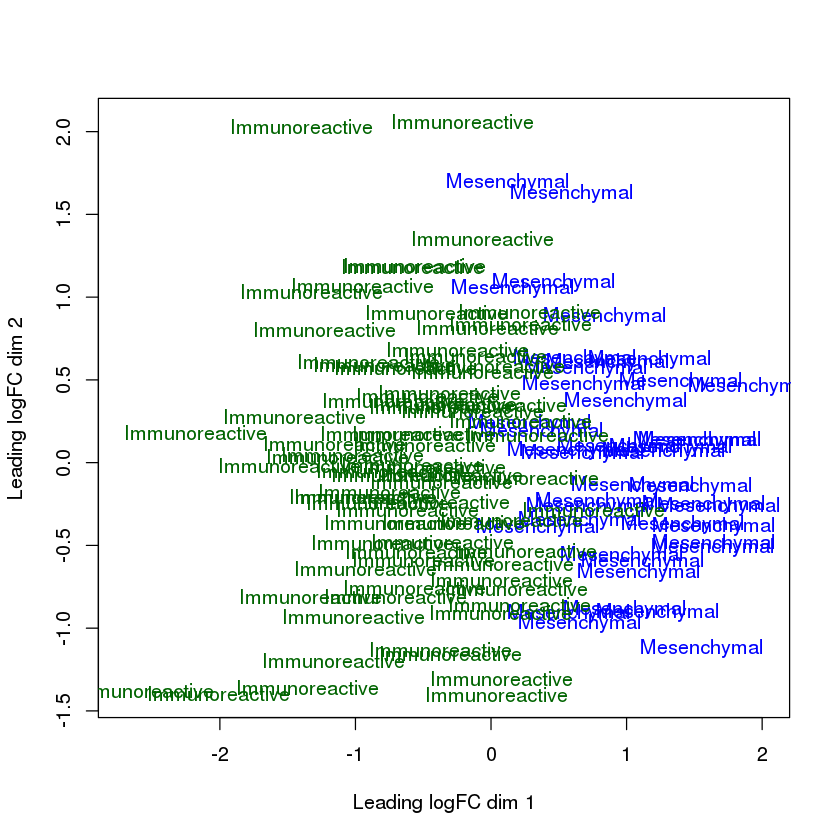

In [13]:
mds_output  <- plotMDS(d, labels=classDefinitions_RNAseq$SUBTYPE, 
                       col= c("darkgreen","blue")[factor(classDefinitions_RNAseq$SUBTYPE)])

* Estimate dispersion

In [14]:
d <- estimateCommonDisp(d)
d <- estimateTagwiseDisp(d)

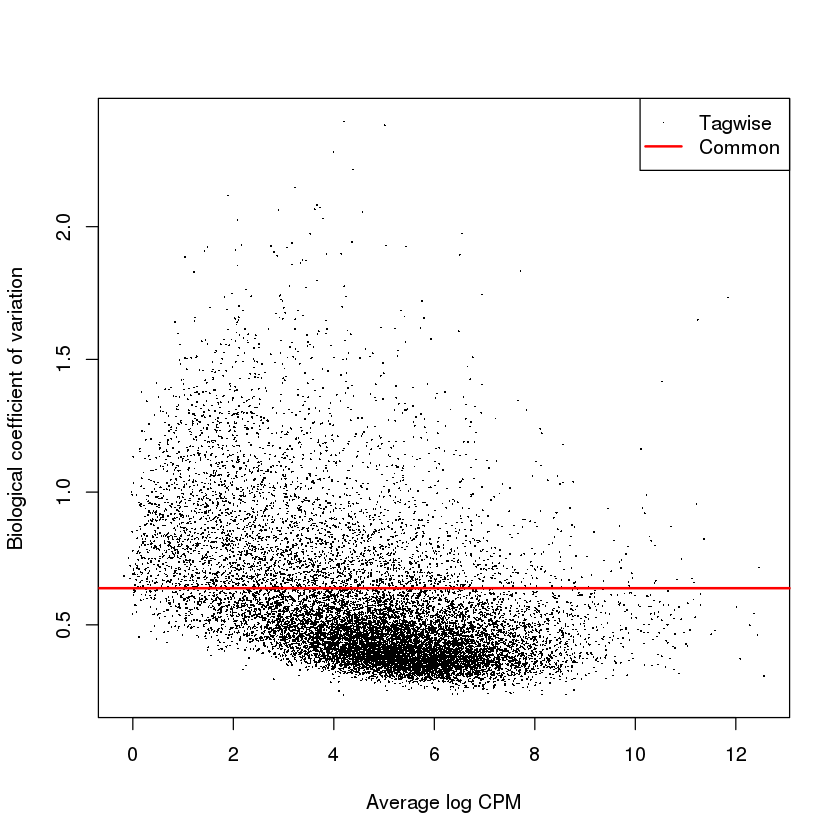

In [15]:
plotBCV(d)

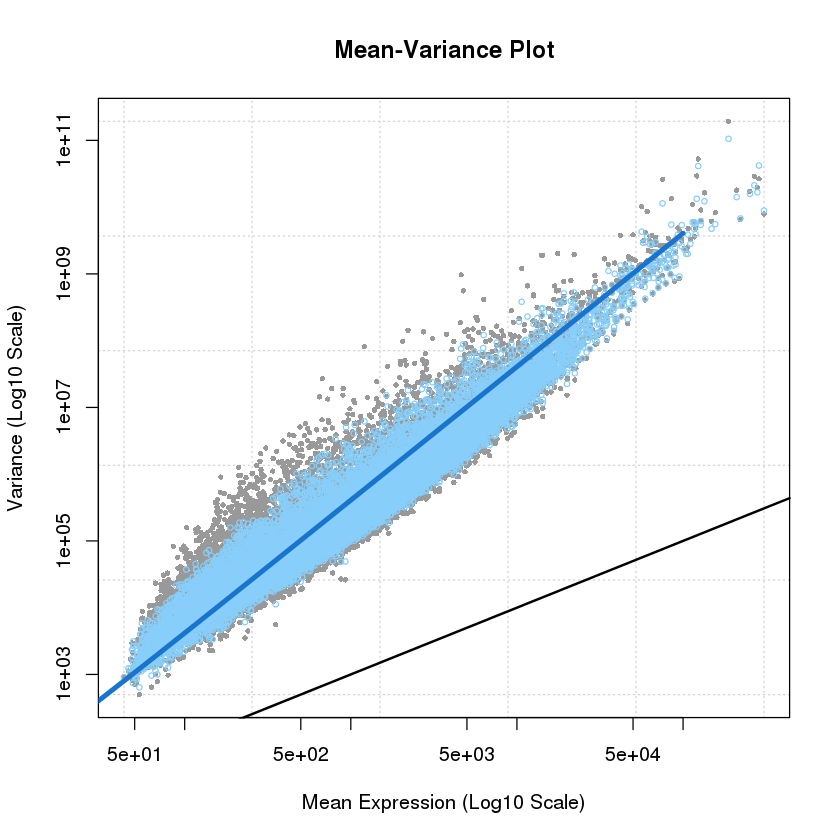

In [16]:
plotMeanVar( d ,show.raw.vars=TRUE , show.tagwise.vars=TRUE , show.binned.common.disp.vars=FALSE , 
            show.ave.raw.vars=FALSE , NBline = TRUE , nbins = 100 , pch = 16 , 
            xlab ="Mean Expression (Log10 Scale)" , ylab = "Variance (Log10 Scale)" , 
            main = "Mean-Variance Plot" )

* Calculate differential expression - Exact test

In [17]:
de <- exactTest(d, pair=c("Immunoreactive","Mesenchymal"))
tt <- topTags(de,n=nrow(d))

In [18]:
head(tt$table)

,logFC,logCPM,PValue,FDR
BGN|633,1.747536,9.053804,1.727865e-33,2.496765e-29
ANTXR1|84168,1.552,7.503491,4.39466e-31,3.175142e-27
FZD1|8321,1.284829,5.522299,4.411722e-30,2.12498e-26
COL16A1|1307,1.616403,5.09389,1.331222e-29,4.809041e-26
GPC6|10082,2.126685,3.697474,4.941914e-29,1.428213e-25
TSPAN11|441631,2.502514,1.929548,1.291615e-28,3.110639e-25


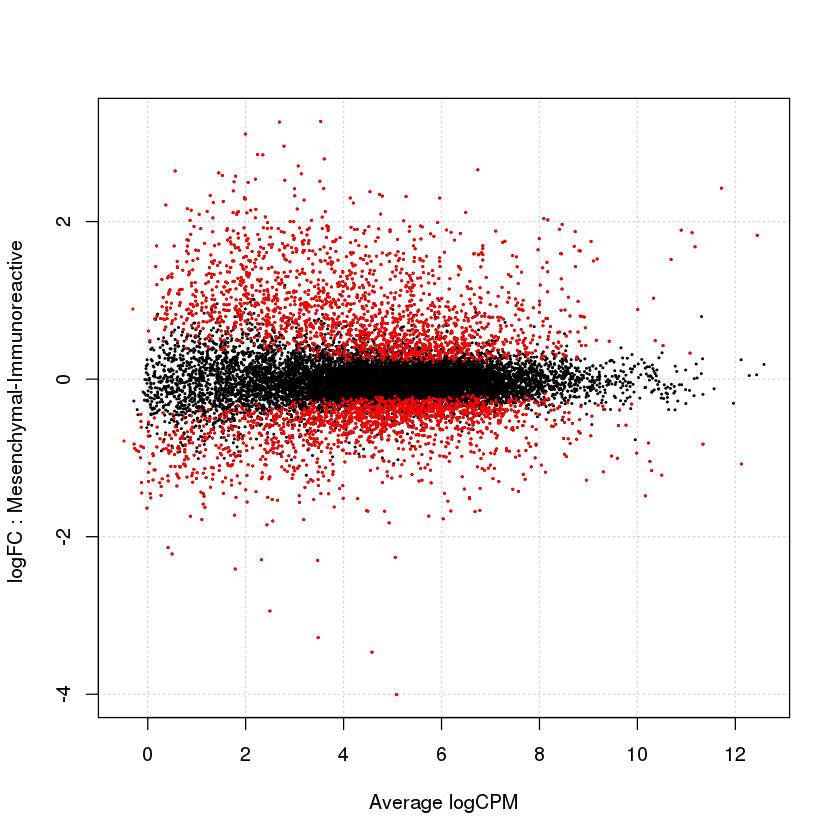

In [19]:
nc=cpm(d, normalized.lib.sizes = TRUE)
rn = rownames(tt$table)
deg =rn[tt$table$FDR<0.05]
plotSmear(d,de.tags=deg)

Number of significant genes by Exact test (FDR <0.05)

In [20]:
length(deg)

[1] 3538

## 8. Create a rank file to be used for GSEA.

In order to run PreRankedGSEA you need a two column file where each line contains a gene/protein/probe and its associated score (differential expression value).  GSEA looks for enrichment in the top and bottom part of the list.  If you use the p-value as the score, GSEA will look for enrichment in the set of most differentially expressed genes at the top of the list as well as the least differentially expressed genes at the bottom of the list. Generally, we are primarily interested at looking for enrichment in the upregulated genes (top of the list) and downregulated genes (bottom of the list).

><span style="color:purple">**TIP: A better score to use for the rank file is then the t-statistic which indicates the strength of differential expression as well as the direction.  Like many specialized analysis packages edgeR performs high level tests that model biological variability and other factors in order to calculate differential expression.  There are multiple options within edgeR to calculate differential expression (exact test, generalized linear model likelihood ratio test or the quasi-likelihood F-test).  If using the quasi-likelihood F-test then you can use the F-stat to create the rank file in the same way you can us a t-statistic.  More often than not statistical analysis performed by data centers supply p-values and foldchange over a statistic.  In the absence of such a statistic we can create a rank using the negative log(p-value) and sign of the fold change.  Genes at the top of the list are more highly expressed in class A and genes at the bottom of the list in class B. **</span>

In [21]:
ranks_RNAseq = sign(tt$table$logFC) * -log10(tt$table$PValue)
genenames <- unlist(lapply( rownames(tt$table), function(data) {unlist(strsplit(data,"\\|"))[1]}))
geneids <- unlist(lapply( rownames(tt$table), function(data) {unlist(strsplit(data,"\\|"))[2]}))

ranks_RNAseq <- cbind(genenames, ranks_RNAseq)
colnames(ranks_RNAseq) <- c("GeneName","rank")

head(ranks_RNAseq)

GeneName,rank
BGN,32.7624902258565
ANTXR1,30.3570747317634
FZD1,29.3553918174267
COL16A1,28.875749397344
GPC6,28.3061047806309
TSPAN11,27.8888670133341


In [22]:
write.table(ranks_RNAseq,"MesenchymalvsImmunoreactive_edger_ranks.rnk", col.name =TRUE, sep="\t", 
            row.names =FALSE, quote =FALSE)

## 9. Create an expression file to be used in the Enrichment Map

An expression file is similar to the expression Matrix except it has an additional column at the front in addition to the gene/protein/probe name.  This column can contain any text value and often it contains the description of the gene/protein/probe.

In [23]:
normalized_expression_RNAseq <- cpm(d, normalized.lib.size=TRUE)
genenames <- unlist(lapply( rownames(normalized_expression_RNAseq), function(data) {unlist(strsplit(data,"\\|"))[1]}))
geneids <- unlist(lapply( rownames(normalized_expression_RNAseq), function(data) {unlist(strsplit(data,"\\|"))[2]}))
EM_expressionFile_RNAseq <- cbind(genenames[which(genenames != "?")], geneids[which(genenames != "?")],
                                  normalized_expression_RNAseq[which(genenames != "?"),])
colnames(EM_expressionFile_RNAseq)[1] <- "Name"
colnames(EM_expressionFile_RNAseq)[2] <- "geneid"
colnames(EM_expressionFile_RNAseq) <- substring(colnames(EM_expressionFile_RNAseq),1,12)

write.table(EM_expressionFile_RNAseq, "MesenchymalvsImmunoreactive_RNAseq_expression.txt",col.name=TRUE,sep="\t",
            row.names=FALSE,quote=FALSE)

## 10.Create subsets of genes that can be used in g:Profiler or any thresholded enrichment tool

The subsets of genes that can be used for a thresholded method can be any set of genes.  You can uses the entire set of genes that have a significant p-value, a significant corrected p-value, up-regulated with a significant p-value, down regulated with a significant p-value or any combination of thresholds.
* To get all significant genes:

In [24]:
#get the number of significant genes
length(which(tt$table$FDR < 0.001))

[1] 1541

In [25]:
mesenvsimmuno_list <- unlist(
    lapply(rownames(tt$table[which(tt$table$FDR<0.001),]), 
           function(data) {unlist(strsplit(data,"\\|"))[1]}))
head(mesenvsimmuno_list)

[1] "BGN"     "ANTXR1"  "FZD1"    "COL16A1" "GPC6"    "TSPAN11"

In [26]:
write.table(mesenvsimmuno_list,"mesenvsimmuno_RNAseq_gprofiler.txt",
            col.name=FALSE,sep="\t",row.names=FALSE,quote=FALSE)

* To get significant genes for Immunoreactive only:

Immunoreactive genes will have negative logFC (logFC <0)

In [27]:
#get the number of significant genes - Immunoreactive
length(which(tt$table$FDR < 0.001 & tt$table$logFC < 0))

[1] 517

In [28]:
mesenvsimmuno_immuno_ordered_list <- unlist(
    lapply(rownames(tt$table[which(tt$table$FDR<0.001 & tt$table$logFC < 0),]), 
                function(data) {unlist(strsplit(data,"\\|"))[1]}))
head(mesenvsimmuno_immuno_ordered_list)

[1] "PSMB9" "TAP1"  "GBP4"  "HLA-F" "PSMB8" "IRF1"

In [29]:
write.table(mesenvsimmuno_immuno_ordered_list,
            "mesenvsimmuno_immunoonly_RNAseq_gprofiler.txt",col.name=FALSE,sep="\t",
            row.names=FALSE,quote=FALSE)

* To get significant genes for  Mesenchymal only:

Mesenchymal genes will have positive logFC (logFC >0)

In [30]:
#get the number of significant genes - Mesenchymal
length(which(tt$table$FDR < 0.001 & tt$table$logFC > 0))

[1] 1024

In [31]:
mesenvsimmuno_mesen_ordered_list <- unlist(
    lapply(rownames(tt$table[which(tt$table$FDR<0.001 & tt$table$logFC > 0),]), 
        function(data) {unlist(strsplit(data,"\\|"))[1]}))
head(mesenvsimmuno_mesen_ordered_list)

[1] "BGN"     "ANTXR1"  "FZD1"    "COL16A1" "GPC6"    "TSPAN11"

In [32]:
write.table(mesenvsimmuno_mesen_ordered_list,
            "mesenvsimmuno_mesenonly_RNAseq_gprofiler.txt",col.name=FALSE,sep="\t",
            row.names=FALSE,quote=FALSE)

## 11. Examine the results using heatmaps

Heatmaps can easily show the separation between our classes.  Limiting by the most signifincant set we can see if the scoring accurately separates class A from class B. 

In [33]:
library("pheatmap")
library("RColorBrewer")

In [34]:
#Annotate the columns with the subtype the patient belongs to.
annotation_col <- data.frame(SUBTYPE= factor(classDefinitions_RNAseq[,3]))
rownames(annotation_col) <- classDefinitions_RNAseq[,2]
ann_colors = list(
  SUBTYPE = c(Immunoreactive = "#1B9E77", Mesenchymal = "#D95F02")
)

col.pal <- rev(brewer.pal(11,"RdBu")) #create colour pallete of red and blue with 11 gradients
#filter the data to just include genes that have FDR < 0.05
matrix_for_heatmap <- as.matrix(
    EM_expressionFile_RNAseq[rownames(EM_expressionFile_RNAseq) 
            %in% rownames(tt$table)[which(tt$table$FDR<0.05)],
                    3:dim(EM_expressionFile_RNAseq)[2] ])

class(matrix_for_heatmap) <- "numeric"
matrix_for_heatmap[matrix_for_heatmap == 0] <- 0.0000001

In [35]:
dim(matrix_for_heatmap)

[1] 3538  119

In [ ]:
# use the pheatmap library to create a pretty heatmap of all significant results
# annotate the heatmap with class each sample comes from
# cluster the genes (rows) but keep the classes together. 
pheatmap(matrix_for_heatmap, color = col.pal,
         scale = "row",show_rownames = F, show_colnames = F,
         main = "heatmap top genes(Mesen vs Immuno)",
         cluster_rows = TRUE, cluster_cols = FALSE,clustering_distance_rows = "correlation",
         annotation_col=annotation_col, annotation_colors = ann_colors)

* cluster just the top 10 up (mesenchymal specific) and down (immunoreactive specific) regulated genes to get a better idea what the logFC mean

In [ ]:
down <- tt$table$FDR < 0.05 & tt$table$logFC <0
up <- tt$table$FDR < 0.05 & tt$table$logFC >0

matrix_for_heatmap <- as.matrix(
    EM_expressionFile_RNAseq[rownames(EM_expressionFile_RNAseq) %in% rownames(tt$table)
                        [which(down)[1:10]],3:dim(EM_expressionFile_RNAseq)[2] ])
class(matrix_for_heatmap) <- "numeric"
matrix_for_heatmap[matrix_for_heatmap == 0] <- 0.0000001

pheatmap(log(matrix_for_heatmap), color = col.pal,
         scale = "row",show_rownames = T, show_colnames = F,
         main = "top 'Down' genes - Immunoreactive specific",
         cluster_rows = TRUE, cluster_cols = FALSE,
         clustering_distance_rows = "correlation",annotation_col=annotation_col, 
         annotation_colors = ann_colors)

matrix_for_heatmap <- as.matrix(
    EM_expressionFile_RNAseq[rownames(EM_expressionFile_RNAseq) %in% rownames(tt$table)
                        [which(up)[1:10]],3:dim(EM_expressionFile_RNAseq)[2] ])

class(matrix_for_heatmap) <- "numeric"
matrix_for_heatmap[matrix_for_heatmap == 0] <- 0.0000001

pheatmap(log(matrix_for_heatmap), color = col.pal,
         scale = "row",show_rownames = T, show_colnames = F,
         main = "top 'Up' genes - Mesenchymal specific",
         cluster_rows = TRUE, cluster_cols = FALSE,
         clustering_distance_rows = "correlation",annotation_col=annotation_col, 
         annotation_colors = ann_colors)
